<a href="https://colab.research.google.com/github/LimPark996/metal-defect-synthesis/blob/main/V0/metal_defect_HaltonMaskGIT(PoCFinal).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🔧 Halton-MaskGIT for Metal Defect Synthesis

## 개요
이 노트북은 **Halton-MaskGIT** (ICLR 2025)와 **LlamaGen VQGAN**을 사용하여
금속 결함 이미지를 생성하는 파이프라인입니다.

## 참고 논문
1. **MaskGIT**: "Masked Generative Image Transformer" (CVPR 2022)
   - https://arxiv.org/abs/2202.04200
2. **Halton-MaskGIT**: "Halton Scheduler for Masked Generative Image Transformer" (ICLR 2025)
   - https://openreview.net/forum?id=RDVrlWAb7K
3. **LlamaGen**: "Autoregressive Model Beats Diffusion: Llama for Scalable Image Generation"
   - https://arxiv.org/abs/2406.06525

## 전체 파이프라인
```
1. 환경 설정: Halton-MaskGIT 클론 + 의존성 설치
2. Fine-tuned LlamaGen VQGAN 로드 (토크나이저, 학습 X)
3. 결함 이미지 → 토큰 변환 (캐시 생성)
4. Halton-MaskGIT Transformer 정의
5. 학습 (마스킹 + Cross Entropy Loss)
6. Halton Sampler로 이미지 생성
```

## 아키텍처 비교
| 구성요소 | 기존 노트북 | 이 노트북 |
|---------|-----------|----------|
| VQGAN | taming-transformers | **LlamaGen VQ-16** |
| Codebook dim | 256 | **8** (더 효율적) |
| Transformer | 기본 nn.TransformerEncoder | **DiT-style + AdaLayerNorm** |
| 클래스 조건 | 단순 더하기 | **AdaLN (더 강력)** |
| Sampler | Confidence | **Halton (ICLR 2025)** |

---
# Part 1: 환경 설정
---

In [ ]:
# GPU 확인
!nvidia-smi

Fri Dec 12 05:40:13 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   32C    P0             56W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
# Google Drive 마운트
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 폴더 구조 생성
!mkdir -p "/content/drive/MyDrive/metal-defect/halton-maskgit"
!mkdir -p "/content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints"
!mkdir -p "/content/drive/MyDrive/metal-defect/halton-maskgit/samples"
!mkdir -p "/content/drive/MyDrive/metal-defect/halton-maskgit/token_cache"

print("✅ 폴더 구조 생성 완료")

✅ 폴더 구조 생성 완료


In [ ]:
# ============================================
# Halton-MaskGIT 및 LlamaGen 클론
# ============================================

# 1. Halton-MaskGIT 클론 (ICLR 2025)
!git clone https://github.com/valeoai/Halton-MaskGIT.git

# 2. LlamaGen 클론 (VQGAN용)
!git clone https://github.com/FoundationVision/LlamaGen.git

print("✅ 레포지토리 클론 완료")

Cloning into 'Halton-MaskGIT'...
remote: Enumerating objects: 247, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 247 (delta 51), reused 38 (delta 38), pack-reused 173 (from 1)
Receiving objects: 100% (247/247), 14.11 MiB | 7.50 MiB/s, done.
Resolving deltas: 100% (87/87), done.
Cloning into 'LlamaGen'...
remote: Enumerating objects: 191, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 191 (delta 59), reused 38 (delta 38), pack-reused 97 (from 1)
Receiving objects: 100% (191/191), 5.49 MiB | 20.36 MiB/s, done.
Resolving deltas: 100% (75/75), done.
✅ 레포지토리 클론 완료


In [ ]:
# ============================================
# 의존성 설치
# ============================================

# Halton-MaskGIT 의존성
!pip install einops clean-fid

# 기타 필요 라이브러리
!pip install timm

print("✅ 의존성 설치 완료")

✅ 의존성 설치 완료


In [ ]:
# ============================================
# 기본 라이브러리 임포트
# ============================================

import os
import sys
import math
import random
import numpy as np
from tqdm import tqdm
from PIL import Image
from glob import glob
from collections import Counter, defaultdict

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt

# LlamaGen 경로 추가
sys.path.append('/content/LlamaGen')

# Halton-MaskGIT 경로 추가
sys.path.append('/content/Halton-MaskGIT')

# 재현성을 위한 시드 고정
def set_seed(seed=42):
    """모든 랜덤 시드를 고정하여 실험 재현성 확보"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

# 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️ 사용 디바이스: {device}")

# CUDA 최적화
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    print(f"🚀 TF32 활성화됨")

🖥️ 사용 디바이스: cuda
🚀 TF32 활성화됨


/usr/local/lib/python3.12/dist-packages/torch/backends/__init__.py:46: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  self.setter(val)


In [ ]:
# ============================================
# 경로 설정
# ============================================

# === VQGAN 관련 ===
# Fine-tuned LlamaGen VQGAN 체크포인트 경로
VQGAN_CKPT_PATH = "/content/drive/MyDrive/metal-defect/LlamaGen/checkpoints/vqgan_finetune_up_epoch50.pt"

# === 데이터 관련 ===
# 통합 데이터셋 경로 (NEU-DET + SD-saliency + X-SDD)
DATA_PATH = "/content/drive/MyDrive/metal-defect/data/merged_dataset_200x200"

# === 저장 경로 ===
SAVE_DIR = "/content/drive/MyDrive/metal-defect/halton-maskgit"
TOKEN_CACHE_PATH = f"{SAVE_DIR}/token_cache/defect_tokens.pt"
CKPT_DIR = f"{SAVE_DIR}/checkpoints"
SAMPLE_DIR = f"{SAVE_DIR}/samples"

# === 모델 설정 ===
# LlamaGen VQGAN 스펙 (고정값)
CODEBOOK_SIZE = 16384      # 코드북 크기
CODEBOOK_DIM = 8           # 코드북 임베딩 차원 (taming: 256, LlamaGen: 8)
DOWNSAMPLE_FACTOR = 16     # 다운샘플 비율 (256 → 16)
LATENT_SIZE = 16           # 256 / 16 = 16
SEQ_LEN = LATENT_SIZE ** 2 # 16 * 16 = 256 토큰

# MaskGIT 설정
MASK_TOKEN_ID = CODEBOOK_SIZE  # [MASK] = 16384
NUM_CLASSES = 6                 # 결함 클래스 수

# 클래스 이름
CLASS_NAMES = [
    'crazing',         # 0: 균열
    'inclusion',       # 1: 개재물
    'patches',         # 2: 패치
    'pitted_surface',  # 3: 피팅
    'rolled-in_scale', # 4: 압연 스케일
    'scratches'        # 5: 스크래치
]

print("=" * 50)
print("📁 경로 설정")
print("=" * 50)
print(f"VQGAN 체크포인트: {VQGAN_CKPT_PATH}")
print(f"데이터 경로: {DATA_PATH}")
print(f"저장 디렉토리: {SAVE_DIR}")
print()
print("=" * 50)
print("⚙️ 모델 설정")
print("=" * 50)
print(f"Codebook 크기: {CODEBOOK_SIZE}")
print(f"Codebook 차원: {CODEBOOK_DIM}")
print(f"Latent 크기: {LATENT_SIZE}x{LATENT_SIZE} = {SEQ_LEN} 토큰")
print(f"[MASK] 토큰 ID: {MASK_TOKEN_ID}")
print(f"클래스 수: {NUM_CLASSES}")
print(f"클래스: {CLASS_NAMES}")

📁 경로 설정
VQGAN 체크포인트: /content/drive/MyDrive/metal-defect/LlamaGen/checkpoints/vqgan_finetune_up_epoch50.pt
데이터 경로: /content/drive/MyDrive/metal-defect/data/merged_dataset_200x200
저장 디렉토리: /content/drive/MyDrive/metal-defect/halton-maskgit

⚙️ 모델 설정
Codebook 크기: 16384
Codebook 차원: 8
Latent 크기: 16x16 = 256 토큰
[MASK] 토큰 ID: 16384
클래스 수: 6
클래스: ['crazing', 'inclusion', 'patches', 'pitted_surface', 'rolled-in_scale', 'scratches']


---
# Part 2: LlamaGen VQGAN 로드
---

## taming-transformers vs LlamaGen VQGAN 차이

| 항목 | taming-transformers | LlamaGen |
|------|--------------------|---------|
| Codebook 차원 | 256 | **8** |
| L2 정규화 | ❌ | ✅ |
| Encoder 출력 | z → quant_conv → quantize | encoder → quant_conv → **l2_norm** → quantize |
| 성능 | 좋음 | **더 좋음** (LlamaGen 논문 참고) |

## 왜 LlamaGen VQGAN?
1. **Halton-MaskGIT이 공식적으로 LlamaGen VQGAN 사용**
2. **8차원 codebook이 더 효율적** (메모리, 속도)
3. **L2 정규화로 codebook collapse 방지**

In [ ]:
# ============================================
# LlamaGen VQGAN 모델 정의
# ============================================

# LlamaGen의 VQ 모델 임포트
from tokenizer.tokenizer_image.vq_model import VQ_models

print("✅ LlamaGen VQ_models 임포트 완료")
print(f"사용 가능한 모델: {list(VQ_models.keys())}")

✅ LlamaGen VQ_models 임포트 완료
사용 가능한 모델: ['VQ-16', 'VQ-8']


In [ ]:
# ============================================
# Fine-tuned VQGAN 로드
# ============================================

def load_vqgan(ckpt_path, device):
    """
    Fine-tuned LlamaGen VQGAN 로드

    Args:
        ckpt_path: 체크포인트 경로
        device: cuda or cpu

    Returns:
        vqgan: 로드된 VQGAN 모델 (eval 모드)
    """
    # 1. 모델 생성
    # VQ-16: downscale factor 16 (256x256 → 16x16)
    vqgan = VQ_models["VQ-16"](
        codebook_size=CODEBOOK_SIZE,     # 16384
        codebook_embed_dim=CODEBOOK_DIM  # 8
    )

    # 2. 체크포인트 로드
    checkpoint = torch.load(ckpt_path, map_location="cuda")

    # 체크포인트 구조 확인
    if "vqmodel" in checkpoint:
        state_dict = checkpoint["vqmodel"]
    elif "state_dict" in checkpoint:
        state_dict = checkpoint["state_dict"]
    else:
        state_dict = checkpoint

    # 3. 가중치 로드
    vqgan.load_state_dict(state_dict, strict=True)

    # 4. 디바이스 이동 + eval 모드
    vqgan = vqgan.to(device)
    vqgan.eval()

    # 5. 파라미터 고정 (학습 안 함)
    for param in vqgan.parameters():
        param.requires_grad = False

    return vqgan

# VQGAN 로드
print("VQGAN 로딩 중...")
vqgan = load_vqgan(VQGAN_CKPT_PATH, device)
print(f"✅ VQGAN 로드 완료")
print(f"   파라미터 수: {sum(p.numel() for p in vqgan.parameters()):,}")
print(f"   학습 가능: {sum(p.numel() for p in vqgan.parameters() if p.requires_grad):,} (0 = 고정됨)")

VQGAN 로딩 중...
✅ VQGAN 로드 완료
   파라미터 수: 71,883,403
   학습 가능: 0 (0 = 고정됨)


In [ ]:
# ============================================
# VQGAN 인코딩/디코딩 함수 정의
# ============================================

@torch.no_grad()
def encode_to_tokens(images, vqgan_model):
    """
    이미지를 VQGAN으로 인코딩하여 토큰 인덱스 반환

    LlamaGen VQGAN의 encode 과정:
    1. images → encoder → z (feature map)
    2. z → quant_conv → z_q (차원 축소: 256 → 8)
    3. z_q → L2 normalize → quantize → indices

    Args:
        images: [B, 3, 256, 256] 텐서, 값 범위 [-1, 1]
        vqgan_model: LlamaGen VQGAN 모델

    Returns:
        tokens: [B, 16, 16] 텐서, 각 값은 0 ~ 16383
    """
    # LlamaGen의 encode 메서드 사용
    # 반환: (z_quantized, codebook_loss, (perplexity, min_encodings, indices))
    _, _, (_, _, indices) = vqgan_model.encode(images)

    # indices: [B*H*W] → [B, H, W]
    batch_size = images.shape[0]
    tokens = indices.view(batch_size, LATENT_SIZE, LATENT_SIZE)

    return tokens


@torch.no_grad()
def decode_from_tokens(tokens, vqgan_model):
    """
    토큰 인덱스를 VQGAN으로 디코딩하여 이미지 반환
    """
    # batch_size 추출
    batch_size = tokens.shape[0]

    # 완전 flatten: [B, 16, 16] 또는 [B, 256] → [B*256]
    tokens_flat = tokens.view(-1)

    # 범위 클램핑
    tokens_flat = torch.clamp(tokens_flat, 0, CODEBOOK_SIZE - 1)

    # shape: (batch, channel, height, width)
    embed_dim = vqgan_model.quantize.embedding.weight.shape[1]

    images = vqgan_model.decode_code(
        tokens_flat,
        shape=(batch_size, embed_dim, LATENT_SIZE, LATENT_SIZE)
    )

    return images


print("✅ 인코딩/디코딩 함수 정의 완료")

✅ 인코딩/디코딩 함수 정의 완료


In [ ]:
# ============================================
# VQGAN 인코딩/디코딩 테스트
# ============================================

print("🧪 VQGAN 테스트 중...")

# 테스트용 더미 이미지 생성
test_img = torch.randn(2, 3, 256, 256).to(device)  # 배치 2
test_img = torch.clamp(test_img, -1, 1)  # [-1, 1] 범위로

# 인코딩 테스트
tokens = encode_to_tokens(test_img, vqgan)
print(f"\n📥 인코딩 결과:")
print(f"   입력 이미지: {test_img.shape}")      # [2, 3, 256, 256]
print(f"   출력 토큰: {tokens.shape}")          # [2, 16, 16]
print(f"   토큰 범위: {tokens.min().item()} ~ {tokens.max().item()}")  # 0 ~ 16383

# 디코딩 테스트
reconstructed = decode_from_tokens(tokens, vqgan)
print(f"\n📤 디코딩 결과:")
print(f"   입력 토큰: {tokens.shape}")          # [2, 16, 16]
print(f"   출력 이미지: {reconstructed.shape}") # [2, 3, 256, 256]
print(f"   값 범위: {reconstructed.min().item():.3f} ~ {reconstructed.max().item():.3f}")

# 재구성 오류 계산
recon_error = F.mse_loss(test_img, reconstructed)
print(f"\n📊 재구성 MSE: {recon_error.item():.6f}")

print("\n✅ VQGAN 테스트 완료!")

🧪 VQGAN 테스트 중...

📥 인코딩 결과:
   입력 이미지: torch.Size([2, 3, 256, 256])
   출력 토큰: torch.Size([2, 16, 16])
   토큰 범위: 12 ~ 16379

📤 디코딩 결과:
   입력 토큰: torch.Size([2, 16, 16])
   출력 이미지: torch.Size([2, 3, 256, 256])
   값 범위: -1.296 ~ 1.503

📊 재구성 MSE: 0.609462

✅ VQGAN 테스트 완료!


---
# Part 3: 데이터 준비 (토큰 캐시 생성)
---

## 왜 토큰 캐시를 만드나?

MaskGIT은 **토큰 공간**에서 학습합니다:
- 입력: 이미지가 아닌 **VQGAN 토큰** (16×16 = 256개)
- 출력: 마스킹된 토큰 위치의 **예측 토큰**

매번 이미지를 인코딩하면 느리므로, 미리 토큰으로 변환해서 저장합니다.

```
이미지 (256×256×3) → VQGAN Encoder → 토큰 (16×16) + 라벨
                                         ↓
                                    캐시 저장
                                         ↓
                              MaskGIT 학습에 사용
```

## 데이터 형식

Halton-MaskGIT이 기대하는 형식:
```python
data = {
    "code": tensor([B, 16, 16]),  # 토큰 인덱스
    "y": tensor([B]),              # 클래스 라벨 (0~5)
}
```

In [ ]:
# ============================================
# 데이터셋 확인
# ============================================

from torchvision.datasets import ImageFolder

# 전처리 정의
transform = T.Compose([
    T.Resize((256, 256)),              # 256x256으로 리사이즈
    T.Grayscale(num_output_channels=3), # 그레이스케일 → 3채널
    T.ToTensor(),                       # [0, 1] 범위
    T.Normalize([0.5, 0.5, 0.5],        # [-1, 1] 범위로 정규화
                [0.5, 0.5, 0.5])
])

# 데이터셋 로드 (확인용)
dataset = ImageFolder(root=DATA_PATH, transform=transform)

print("=" * 50)
print("📊 데이터셋 정보")
print("=" * 50)
print(f"총 이미지 수: {len(dataset)}장")
print(f"클래스 수: {len(dataset.classes)}")
print(f"클래스 목록: {dataset.classes}")

# 클래스별 이미지 수
print("\n클래스별 이미지 수:")
class_counts = Counter([label for _, label in dataset.samples])
for cls_name, cls_idx in sorted(dataset.class_to_idx.items(), key=lambda x: x[1]):
    print(f"   {cls_idx}: {cls_name} - {class_counts[cls_idx]}장")

📊 데이터셋 정보
총 이미지 수: 2659장
클래스 수: 6
클래스 목록: ['crazing', 'inclusion', 'patches', 'pitted_surface', 'rolled-in_scale', 'scratches']

클래스별 이미지 수:
   0: crazing - 240장
   1: inclusion - 540장
   2: patches - 662장
   3: pitted_surface - 240장
   4: rolled-in_scale - 303장
   5: scratches - 674장


In [ ]:
# ============================================
# 데이터 증강 함수
# ============================================

def get_augmented_versions(img_tensor):
    """
    이미지 텐서에 8가지 증강 적용

    Args:
        img_tensor: [3, 256, 256] 텐서

    Returns:
        list of [3, 256, 256] 텐서 (8개)
    """
    versions = []
    versions.append(img_tensor)                           # 1. 원본
    versions.append(TF.hflip(img_tensor))                 # 2. 좌우반전
    versions.append(TF.vflip(img_tensor))                 # 3. 상하반전
    versions.append(TF.rotate(img_tensor, 90))            # 4. 90도
    versions.append(TF.rotate(img_tensor, 180))           # 5. 180도
    versions.append(TF.rotate(img_tensor, 270))           # 6. 270도
    versions.append(TF.hflip(TF.rotate(img_tensor, 90)))  # 7. 90도 + 좌우반전
    versions.append(TF.vflip(TF.rotate(img_tensor, 90)))  # 8. 90도 + 상하반전
    return versions

print(f"✅ 증강 함수 정의 완료 (8배 증강)")

✅ 증강 함수 정의 완료 (8배 증강)


In [ ]:
# ============================================
# 토큰 캐시 생성
# ============================================

def create_token_cache(dataset, vqgan_model, cache_path, augment=True):
    """
    전체 데이터셋을 VQGAN 토큰으로 변환하여 캐시 생성

    Args:
        dataset: ImageFolder 데이터셋
        vqgan_model: VQGAN 모델
        cache_path: 저장 경로
        augment: 데이터 증강 여부

    Returns:
        dict: {tokens, labels, class_names, ...}
    """
    all_tokens = []
    all_labels = []

    dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=2)

    for img, label in tqdm(dataloader, desc="토큰 변환 중"):
        img = img.to(device).squeeze(0)  # [3, 256, 256]

        if augment:
            # 8배 증강
            aug_imgs = get_augmented_versions(img)
            for aug_img in aug_imgs:
                aug_img = aug_img.unsqueeze(0)  # [1, 3, 256, 256]
                tokens = encode_to_tokens(aug_img, vqgan_model)  # [1, 16, 16]
                all_tokens.append(tokens.cpu())
                all_labels.append(label)
        else:
            # 증강 없이 원본만
            img = img.unsqueeze(0)  # [1, 3, 256, 256]
            tokens = encode_to_tokens(img, vqgan_model)  # [1, 16, 16]
            all_tokens.append(tokens.cpu())
            all_labels.append(label)

    # 합치기
    all_tokens = torch.cat(all_tokens, dim=0)  # [N, 16, 16]
    all_labels = torch.cat(all_labels, dim=0)  # [N]

    # 저장할 데이터
    cache_data = {
        'tokens': all_tokens,
        'labels': all_labels,
        'class_names': dataset.classes,
        'num_classes': len(dataset.classes),
        'codebook_size': CODEBOOK_SIZE,
        'seq_len': SEQ_LEN,
        'latent_size': LATENT_SIZE,
    }

    # 저장
    os.makedirs(os.path.dirname(cache_path), exist_ok=True)
    torch.save(cache_data, cache_path)

    return cache_data


# 캐시 생성 또는 로드
if os.path.exists(TOKEN_CACHE_PATH):
    print(f"📂 기존 캐시 로드 중: {TOKEN_CACHE_PATH}")
    cache_data = torch.load(TOKEN_CACHE_PATH)
else:
    print(f"🔄 토큰 캐시 생성 중...")
    cache_data = create_token_cache(dataset, vqgan, TOKEN_CACHE_PATH, augment=True)

print(f"\n✅ 토큰 캐시 준비 완료")
print(f"   토큰 shape: {cache_data['tokens'].shape}")  # [N, 16, 16]
print(f"   라벨 shape: {cache_data['labels'].shape}")  # [N]
print(f"   클래스: {cache_data['class_names']}")

🔄 토큰 캐시 생성 중...


토큰 변환 중: 100%|██████████| 2659/2659 [12:51<00:00,  3.45it/s]



✅ 토큰 캐시 준비 완료
   토큰 shape: torch.Size([21272, 16, 16])
   라벨 shape: torch.Size([21272])
   클래스: ['crazing', 'inclusion', 'patches', 'pitted_surface', 'rolled-in_scale', 'scratches']


In [ ]:
# ============================================
# 토큰 데이터셋 클래스 (Halton-MaskGIT 형식)
# ============================================

class TokenDataset(Dataset):
    """
    Halton-MaskGIT이 기대하는 형식으로 데이터 제공

    __getitem__ 반환:
        dict: {"code": [16, 16], "y": int}
    """

    def __init__(self, tokens, labels):
        """
        Args:
            tokens: [N, 16, 16] 텐서
            labels: [N] 텐서
        """
        self.tokens = tokens
        self.labels = labels

    def __len__(self):
        return len(self.tokens)

    def __getitem__(self, idx):
        # Halton-MaskGIT 형식
        return {
            "code": self.tokens[idx],  # [16, 16]
            "y": self.labels[idx]       # int
        }


# 데이터셋 및 데이터로더 생성
token_dataset = TokenDataset(
    tokens=cache_data['tokens'],
    labels=cache_data['labels']
)

# 학습용 데이터로더
BATCH_SIZE = 32  # 메모리에 맞게 조절

token_dataloader = DataLoader(
    token_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    drop_last=True  # 마지막 불완전한 배치 버림
)

print(f"✅ 데이터로더 생성 완료")
print(f"   데이터셋 크기: {len(token_dataset)}")
print(f"   배치 크기: {BATCH_SIZE}")
print(f"   배치 수: {len(token_dataloader)}")

# 샘플 확인
sample_batch = next(iter(token_dataloader))
print(f"\n📦 샘플 배치:")
print(f"   code shape: {sample_batch['code'].shape}")  # [B, 16, 16]
print(f"   y shape: {sample_batch['y'].shape}")        # [B]

✅ 데이터로더 생성 완료
   데이터셋 크기: 21272
   배치 크기: 32
   배치 수: 664

📦 샘플 배치:
   code shape: torch.Size([32, 16, 16])
   y shape: torch.Size([32])


---
# Part 4: Halton-MaskGIT Transformer
---

## 아키텍처 개요

```
입력: masked_tokens [B, 16, 16] + class_label [B]
      ↓
┌─────────────────────────────────────────┐
│  Token Embedding (16385 → hidden_dim)   │  ← 16384 codebook + 1 [MASK]
│  + Position Embedding (256 → hidden_dim)│
└─────────────────────────────────────────┘
      ↓
┌─────────────────────────────────────────┐
│  Class Embedding → AdaLayerNorm 조건    │  ← 6개 클래스 + 1 (CFG용)
└─────────────────────────────────────────┘
      ↓
┌─────────────────────────────────────────┐
│  Transformer Encoder (N layers)         │
│  - Multi-Head Self-Attention            │
│  - AdaLayerNorm (class condition)       │
│  - SwiGLU FFN                           │
└─────────────────────────────────────────┘
      ↓
┌─────────────────────────────────────────┐
│  Output Head (hidden_dim → 16385)       │  ← Weight Tying with Token Emb
└─────────────────────────────────────────┘
      ↓
출력: logits [B, 256, 16385]
```

## 핵심 구성요소

1. **AdaLayerNorm**: 클래스 조건을 LayerNorm에 주입
2. **SwiGLU**: LLaMA 스타일 FFN (더 좋은 성능)
3. **QK Norm**: Query/Key 정규화 (학습 안정성)
4. **Weight Tying**: 입력 임베딩과 출력 헤드 가중치 공유

In [ ]:
# ============================================
# Halton-MaskGIT Transformer 구현
# ============================================

from einops import rearrange


# ----- 기본 구성요소 -----

def modulate(x, shift, scale):
    """AdaLayerNorm의 modulation 연산"""
    return x * (1 + scale.unsqueeze(1)) + shift.unsqueeze(1)


class RMSNorm(nn.Module):
    """Root Mean Square Layer Normalization"""
    def __init__(self, dim, eps=1e-5):
        super().__init__()
        self.eps = eps
        self.weight = nn.Parameter(torch.ones(dim))

    def forward(self, x):
        norm = x * torch.rsqrt(x.pow(2).mean(-1, keepdim=True) + self.eps)
        return self.weight * norm


class SwiGLU(nn.Module):
    """SwiGLU FFN (LLaMA style)"""
    def __init__(self, dim, hidden_dim, dropout=0.):
        super().__init__()
        # hidden_dim 조정 (SwiGLU는 2/3배 사용)
        hidden_dim = int(2 * hidden_dim / 3)
        # 256의 배수로 맞춤
        hidden_dim = 256 * ((hidden_dim + 255) // 256)

        self.w1 = nn.Linear(dim, hidden_dim, bias=False)
        self.w2 = nn.Linear(hidden_dim, dim, bias=False)
        self.w3 = nn.Linear(dim, hidden_dim, bias=False)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        # SwiGLU: SiLU(W1(x)) * W3(x)
        x = F.silu(self.w1(x)) * self.w3(x)
        x = self.dropout(x)
        x = self.w2(x)
        return x


class QKNorm(nn.Module):
    """Query/Key Normalization for stable attention"""
    def __init__(self, dim):
        super().__init__()
        self.q_norm = RMSNorm(dim)
        self.k_norm = RMSNorm(dim)

    def forward(self, q, k):
        return self.q_norm(q), self.k_norm(k)


class Attention(nn.Module):
    """Multi-Head Self-Attention with QK Norm and Flash Attention"""
    def __init__(self, dim, num_heads, dropout=0.):
        super().__init__()
        self.num_heads = num_heads
        self.head_dim = dim // num_heads
        self.scale = self.head_dim ** -0.5

        self.wq = nn.Linear(dim, dim, bias=False)
        self.wk = nn.Linear(dim, dim, bias=False)
        self.wv = nn.Linear(dim, dim, bias=False)
        self.wo = nn.Linear(dim, dim, bias=False)

        self.qk_norm = QKNorm(dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        B, N, C = x.shape

        # Q, K, V projection
        q, k, v = self.wq(x), self.wk(x), self.wv(x)

        # QK Normalization
        q, k = self.qk_norm(q, k)

        # Reshape for multi-head
        q = q.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)
        k = k.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)
        v = v.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)

        # Flash Attention (PyTorch 2.0+)
        out = F.scaled_dot_product_attention(
            q, k, v,
            dropout_p=self.dropout.p if self.training else 0.
        )

        # Reshape back
        out = out.transpose(1, 2).contiguous().view(B, N, C)
        out = self.wo(out)

        return out


class TransformerBlock(nn.Module):
    """Transformer Block with AdaLayerNorm"""
    def __init__(self, dim, num_heads, mlp_ratio=4., dropout=0.):
        super().__init__()

        # AdaLN modulation MLP
        # 6개 파라미터: gamma1, beta1, alpha1, gamma2, beta2, alpha2
        self.adaLN_modulation = nn.Sequential(
            nn.SiLU(),
            nn.Linear(dim, dim * 6)
        )

        # Attention
        self.norm1 = RMSNorm(dim)
        self.attn = Attention(dim, num_heads, dropout)

        # FFN (SwiGLU)
        self.norm2 = RMSNorm(dim)
        self.ffn = SwiGLU(dim, int(dim * mlp_ratio), dropout)

    def forward(self, x, cond):
        """
        Args:
            x: [B, N, C] 토큰 임베딩
            cond: [B, C] 클래스 조건 임베딩
        """
        # AdaLN modulation 파라미터 계산
        gamma1, beta1, alpha1, gamma2, beta2, alpha2 = \
            self.adaLN_modulation(cond).chunk(6, dim=-1)

        # Attention with AdaLN
        x = x + alpha1.unsqueeze(1) * self.attn(
            modulate(self.norm1(x), beta1, gamma1)
        )

        # FFN with AdaLN
        x = x + alpha2.unsqueeze(1) * self.ffn(
            modulate(self.norm2(x), beta2, gamma2)
        )

        return x


class AdaNorm(nn.Module):
    """Final AdaLayerNorm before output"""
    def __init__(self, dim):
        super().__init__()
        self.norm = RMSNorm(dim)
        self.adaLN = nn.Sequential(
            nn.SiLU(),
            nn.Linear(dim, dim * 2)
        )

    def forward(self, x, cond):
        shift, scale = self.adaLN(cond).chunk(2, dim=-1)
        return modulate(self.norm(x), shift, scale)


print("✅ 기본 구성요소 정의 완료")

✅ 기본 구성요소 정의 완료


In [ ]:
# ============================================
# MaskGIT Transformer 메인 클래스
# ============================================

class MaskGITTransformer(nn.Module):
    """
    Halton-MaskGIT 스타일 Bidirectional Transformer

    특징:
    - AdaLayerNorm으로 클래스 조건 주입
    - SwiGLU FFN
    - QK Normalization
    - Weight Tying (tok_emb ↔ head)
    """

    def __init__(
        self,
        vocab_size=16384,      # codebook 크기
        seq_len=256,           # 토큰 시퀀스 길이 (16*16)
        hidden_dim=512,        # Transformer hidden 차원
        num_layers=12,         # Transformer 레이어 수
        num_heads=8,           # Multi-head attention의 head 수
        mlp_ratio=4.,          # FFN hidden 배율
        dropout=0.1,           # Dropout 비율
        num_classes=6,         # 클래스 수
    ):
        super().__init__()

        self.vocab_size = vocab_size
        self.seq_len = seq_len
        self.hidden_dim = hidden_dim
        self.num_classes = num_classes
        self.mask_token_id = vocab_size  # [MASK] = 16384

        # ===== Embeddings =====
        # 토큰 임베딩: 0~16383 (codebook) + 16384 ([MASK])
        self.tok_emb = nn.Embedding(vocab_size + 1, hidden_dim)

        # 위치 임베딩: 0~255 (16x16 위치)
        self.pos_emb = nn.Embedding(seq_len, hidden_dim)

        # 클래스 임베딩: 0~5 (결함 클래스) + 6 (CFG용 null class)
        self.cls_emb = nn.Embedding(num_classes + 1, hidden_dim)

        # ===== Transformer Blocks =====
        self.blocks = nn.ModuleList([
            TransformerBlock(hidden_dim, num_heads, mlp_ratio, dropout)
            for _ in range(num_layers)
        ])

        # ===== Output =====
        self.final_norm = AdaNorm(hidden_dim)

        # 출력 헤드 (Weight Tying)
        self.head = nn.Linear(hidden_dim, vocab_size + 1, bias=False)
        self.head.weight = self.tok_emb.weight  # ⭐ Weight Tying!

        # 가중치 초기화
        self._init_weights()

    def _init_weights(self):
        """가중치 초기화"""
        # 임베딩 초기화
        nn.init.normal_(self.tok_emb.weight, std=0.02)
        nn.init.normal_(self.pos_emb.weight, std=0.02)
        nn.init.normal_(self.cls_emb.weight, std=0.02)

        # AdaLN modulation 레이어 zero 초기화
        for block in self.blocks:
            nn.init.zeros_(block.adaLN_modulation[1].weight)
            nn.init.zeros_(block.adaLN_modulation[1].bias)

    def forward(self, x, y, drop_label=None):
        """
        순전파

        Args:
            x: [B, H, W] 또는 [B, N] - 마스킹된 토큰 (일부가 16384)
            y: [B] - 클래스 라벨 (0~5)
            drop_label: [B] bool - True면 해당 샘플의 클래스 조건 무시 (CFG용)

        Returns:
            logits: [B, N, vocab_size+1] - 각 위치의 예측 확률
        """
        B = x.shape[0]

        # [B, H, W] → [B, N] 변환
        if x.dim() == 3:
            x = x.view(B, -1)

        # ===== 클래스 조건 처리 =====
        if drop_label is not None:
            # drop_label이 True인 샘플은 null class (num_classes)로 대체
            y = torch.where(drop_label, torch.full_like(y, self.num_classes), y)

        # 클래스 임베딩: [B] → [B, hidden_dim]
        cond = self.cls_emb(y)

        # ===== 토큰 + 위치 임베딩 =====
        # 위치 인덱스 생성
        pos = torch.arange(self.seq_len, device=x.device)

        # 임베딩: [B, N] → [B, N, hidden_dim]
        x = self.tok_emb(x) + self.pos_emb(pos)

        # ===== Transformer 블록 통과 =====
        for block in self.blocks:
            x = block(x, cond)

        # ===== 출력 =====
        x = self.final_norm(x, cond)
        logits = self.head(x)  # [B, N, vocab_size+1]

        return logits


print("✅ MaskGITTransformer 클래스 정의 완료")

✅ MaskGITTransformer 클래스 정의 완료


In [ ]:
# ============================================
# 모델 크기 설정
# ============================================

def get_model_config(size='small'):
    """
    모델 크기별 설정 반환

    Halton-MaskGIT 논문 기준:
    - Tiny:  23M params (hidden=384, depth=6, heads=6)
    - Small: 69M params (hidden=512, depth=12, heads=8)
    - Base:  142M params (hidden=768, depth=12, heads=12)
    - Large: 480M params (hidden=1024, depth=24, heads=16)
    """
    configs = {
        'tiny': {'hidden_dim': 384, 'num_layers': 6, 'num_heads': 6},
        'small': {'hidden_dim': 512, 'num_layers': 12, 'num_heads': 8},
        'base': {'hidden_dim': 768, 'num_layers': 12, 'num_heads': 12},
        'large': {'hidden_dim': 1024, 'num_layers': 24, 'num_heads': 16},
    }
    return configs[size]


# 모델 생성 (Small 사용 - 9000장 데이터에 적합)
MODEL_SIZE = 'small'
model_config = get_model_config(MODEL_SIZE)

print(f"📐 모델 설정: {MODEL_SIZE}")
print(f"   Hidden dim: {model_config['hidden_dim']}")
print(f"   Layers: {model_config['num_layers']}")
print(f"   Heads: {model_config['num_heads']}")

📐 모델 설정: small
   Hidden dim: 512
   Layers: 12
   Heads: 8


In [ ]:
# ============================================
# 모델 생성 및 테스트
# ============================================

# 모델 생성
maskgit = MaskGITTransformer(
    vocab_size=CODEBOOK_SIZE,      # 16384
    seq_len=SEQ_LEN,               # 256
    hidden_dim=model_config['hidden_dim'],
    num_layers=model_config['num_layers'],
    num_heads=model_config['num_heads'],
    mlp_ratio=4.,
    dropout=0.1,
    num_classes=NUM_CLASSES,       # 6
).to(device)

# 파라미터 수 계산
total_params = sum(p.numel() for p in maskgit.parameters())
trainable_params = sum(p.numel() for p in maskgit.parameters() if p.requires_grad)

print(f"\n✅ MaskGIT 모델 생성 완료")
print(f"   총 파라미터: {total_params:,} ({total_params/1e6:.1f}M)")
print(f"   학습 가능: {trainable_params:,}")

# Forward 테스트
print(f"\n🧪 Forward 테스트...")
test_tokens = torch.randint(0, CODEBOOK_SIZE, (2, LATENT_SIZE, LATENT_SIZE)).to(device)
test_labels = torch.randint(0, NUM_CLASSES, (2,)).to(device)
test_drop = torch.tensor([False, True]).to(device)  # 두 번째 샘플은 CFG

with torch.no_grad():
    logits = maskgit(test_tokens, test_labels, test_drop)

print(f"   입력 토큰: {test_tokens.shape}")   # [2, 16, 16]
print(f"   클래스 라벨: {test_labels}")       # [2]
print(f"   출력 logits: {logits.shape}")     # [2, 256, 16385]
print(f"\n✅ Forward 테스트 통과!")


✅ MaskGIT 모델 생성 완료
   총 파라미터: 68,879,872 (68.9M)
   학습 가능: 68,879,872

🧪 Forward 테스트...
   입력 토큰: torch.Size([2, 16, 16])
   클래스 라벨: tensor([3, 4], device='cuda:0')
   출력 logits: torch.Size([2, 256, 16385])

✅ Forward 테스트 통과!


---
# Part 5: 학습 (Training)
---

## 마스킹 전략

MaskGIT의 핵심은 **마스킹 비율을 랜덤하게** 정하는 것입니다:

```
1. 각 배치마다 랜덤 비율 r ~ U(0, 1) 샘플링
2. Arccos schedule로 실제 마스킹 비율 계산
3. 해당 비율만큼 토큰을 [MASK]로 교체
4. 모델이 [MASK] 위치의 원래 토큰 예측
5. Cross Entropy Loss (마스킹 위치에서만)
```

## Arccos Schedule (Halton-MaskGIT)

```python
# Cosine (기존 MaskGIT)
mask_ratio = cos(r * π/2)

# Arccos (Halton-MaskGIT) - 더 균일한 분포
mask_ratio = arccos(r) / (π/2)
```

## CFG (Classifier-Free Guidance)

학습 시 10% 샘플의 클래스 조건을 무시(drop)합니다:
- `drop_label=True` → 클래스 조건 없이 학습 (unconditional)
- 생성 시: `logits = (1+w) * logits_cond - w * logits_uncond`

In [ ]:
# ============================================
# 마스킹 함수 정의 (Halton-MaskGIT 스타일)
# ============================================

def get_mask_schedule(r, mode='arccos'):
    """
    마스킹 스케줄 계산

    Args:
        r: [B] 텐서, 0~1 사이 랜덤 값
        mode: 'arccos' | 'cosine' | 'linear' | 'square'

    Returns:
        mask_ratio: [B] 텐서, 마스킹할 비율 (0~1)
    """
    if mode == 'arccos':  # Halton-MaskGIT 기본
        # r이 0이면 mask_ratio = 1 (전체 마스킹)
        # r이 1이면 mask_ratio = 0 (마스킹 없음)
        return torch.arccos(r) / (math.pi * 0.5)
    elif mode == 'cosine':  # 기존 MaskGIT
        return torch.cos(r * math.pi * 0.5)
    elif mode == 'linear':
        return 1 - r
    elif mode == 'square':
        return 1 - (r ** 2)
    else:
        return 1 - r


def mask_tokens(tokens, mask_token_id, mode='arccos'):
    """
    토큰의 일부를 [MASK]로 교체

    Args:
        tokens: [B, H, W] 원본 토큰
        mask_token_id: [MASK] 토큰 ID (16384)
        mode: 마스킹 스케줄 ('arccos' 권장)

    Returns:
        masked_tokens: [B, H, W] 마스킹된 토큰
        mask: [B, H, W] bool, 마스킹 위치 (True = 마스킹됨)
    """
    device = tokens.device
    B, H, W = tokens.shape
    seq_len = H * W

    # 1. 랜덤 비율 샘플링
    r = torch.rand(B, device=device)
    mask_ratios = get_mask_schedule(r, mode)  # [B]

    # 2. 마스킹할 토큰 수 계산 (최소 1개, 최대 seq_len-1개)
    num_to_mask = (mask_ratios * seq_len).long()
    num_to_mask = torch.clamp(num_to_mask, min=1, max=seq_len-1)

    # 3. 마스킹 수행
    tokens_flat = tokens.view(B, -1)  # [B, 256]
    masked_tokens = tokens_flat.clone()
    mask = torch.zeros(B, seq_len, dtype=torch.bool, device=device)

    for i in range(B):
        num_mask = num_to_mask[i].item()
        # 랜덤 위치 선택
        perm = torch.randperm(seq_len, device=device)
        mask_indices = perm[:num_mask]

        masked_tokens[i, mask_indices] = mask_token_id
        mask[i, mask_indices] = True

    # 원래 shape으로 복원
    masked_tokens = masked_tokens.view(B, H, W)
    mask = mask.view(B, H, W)

    return masked_tokens, mask


# 테스트
print("🧪 마스킹 테스트...")
test_tokens = torch.randint(0, CODEBOOK_SIZE, (4, 16, 16)).to(device)
masked, mask = mask_tokens(test_tokens, MASK_TOKEN_ID, mode='arccos')

print(f"   원본: {test_tokens.shape}")
print(f"   마스킹됨: {masked.shape}")
print(f"   마스크: {mask.shape}")
mask_ratios = [mask[i].sum().item()/256*100 for i in range(4)]
print(f"   샘플별 마스킹 비율: {[f'{r:.1f}%' for r in mask_ratios]}")
print("✅ 마스킹 테스트 완료")

🧪 마스킹 테스트...
   원본: torch.Size([4, 16, 16])
   마스킹됨: torch.Size([4, 16, 16])
   마스크: torch.Size([4, 16, 16])
   샘플별 마스킹 비율: ['41.4%', '96.9%', '22.7%', '73.0%']
✅ 마스킹 테스트 완료


In [ ]:
# ============================================
# 학습 설정
# ============================================

# 하이퍼파라미터
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 0.03
NUM_EPOCHS = 100
WARMUP_EPOCHS = 5
SAVE_EVERY = 10
SAMPLE_EVERY = 10  # 샘플 이미지 생성 주기
DROP_LABEL_PROB = 0.1  # CFG용 라벨 드롭 확률
GRAD_CLIP = 1.0

# Optimizer (AdamW)
optimizer = optim.AdamW(
    maskgit.parameters(),
    lr=LEARNING_RATE,
    betas=(0.9, 0.999),
    weight_decay=WEIGHT_DECAY
)

# Scheduler (Cosine Annealing with Warmup)
def get_lr_scheduler(optimizer, num_epochs, warmup_epochs):
    """Warmup + Cosine Annealing 스케줄러"""
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return (epoch + 1) / warmup_epochs
        else:
            progress = (epoch - warmup_epochs) / (num_epochs - warmup_epochs)
            return 0.5 * (1 + math.cos(math.pi * progress))
    return optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

scheduler = get_lr_scheduler(optimizer, NUM_EPOCHS, WARMUP_EPOCHS)

# Loss Function
criterion = nn.CrossEntropyLoss(ignore_index=-100)

print("=" * 50)
print("⚙️ 학습 설정")
print("=" * 50)
print(f"Learning Rate: {LEARNING_RATE}")
print(f"Weight Decay: {WEIGHT_DECAY}")
print(f"Epochs: {NUM_EPOCHS}")
print(f"Warmup Epochs: {WARMUP_EPOCHS}")
print(f"Label Drop Prob (CFG): {DROP_LABEL_PROB}")
print(f"Gradient Clipping: {GRAD_CLIP}")
print(f"배치 크기: {BATCH_SIZE}")
print(f"배치 수/에폭: {len(token_dataloader)}")

⚙️ 학습 설정
Learning Rate: 0.0001
Weight Decay: 0.03
Epochs: 100
Warmup Epochs: 5
Label Drop Prob (CFG): 0.1
Gradient Clipping: 1.0
배치 크기: 32
배치 수/에폭: 664


In [ ]:
# ============================================
# 학습 함수
# ============================================

def train_one_epoch(model, dataloader, optimizer, criterion, epoch):
    """
    한 에폭 학습

    Returns:
        avg_loss: 평균 손실
        avg_acc: 평균 정확도 (마스킹 위치)
    """
    model.train()
    total_loss = 0
    total_acc = 0
    num_batches = 0

    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")

    for batch in pbar:
        # 1. 데이터 준비
        code = batch['code'].to(device)  # [B, 16, 16]
        y = batch['y'].to(device)        # [B]
        B = code.shape[0]

        # 2. CFG용 라벨 드롭 (10% 확률)
        drop_label = (torch.rand(B, device=device) < DROP_LABEL_PROB)

        # 3. 마스킹 적용
        masked_code, mask = mask_tokens(
            code,
            mask_token_id=MASK_TOKEN_ID,
            mode='arccos'
        )

        # 4. Forward
        logits = model(masked_code, y, drop_label)  # [B, 256, 16385]

        # 5. Loss 계산 (마스킹된 위치에서만)
        B, H, W = code.shape
        logits_flat = logits.view(B * H * W, -1)  # [B*256, 16385]
        target_flat = code.view(-1)               # [B*256]
        mask_flat = mask.view(-1)                 # [B*256]

        # 마스킹 안 된 위치는 -100으로 (ignore_index)
        target_masked = target_flat.clone()
        target_masked[~mask_flat] = -100

        loss = criterion(logits_flat, target_masked)

        # 6. Backward
        optimizer.zero_grad()
        loss.backward()

        # Gradient Clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)

        optimizer.step()

        # 7. 정확도 계산 (마스킹 위치에서만)
        with torch.no_grad():
            pred = logits_flat.argmax(dim=-1)
            correct = (pred == target_flat) & mask_flat
            acc = correct.sum().float() / mask_flat.sum().float()

        # 기록
        total_loss += loss.item()
        total_acc += acc.item()
        num_batches += 1

        # Progress bar 업데이트
        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'acc': f'{acc.item()*100:.1f}%'
        })

    return total_loss / num_batches, total_acc / num_batches


print("✅ 학습 함수 정의 완료")

✅ 학습 함수 정의 완료


---
# Part 6: Halton Sampler (이미지 생성)
---

## Halton Sequence란?

**Quasi-random sequence**로, 랜덤보다 공간을 더 균일하게 커버합니다.

```
Random:  토큰이 한 곳에 몰릴 수 있음
Halton:  공간적으로 균일하게 분포 → 전체 구조를 먼저 잡음
```

## 생성 과정 (32 steps)

```
Step 0:  [MASK] [MASK] [MASK] ... (256개 전부 마스크)
Step 1:  [tok]  [MASK] [tok]  ... (8개 예측)
Step 2:  [tok]  [tok]  [tok]  ... (16개 예측)
....
Step 32: [tok]  [tok]  [tok]  ... (256개 완성)
```

## CFG (Classifier-Free Guidance)

```python
logits_final = (1 + w) * logits_cond - w * logits_uncond
```

- `w=0`: 조건 무시
- `w=1~3`: 적당히 조건 반영 (권장)
- `w=5+`: 강하게 조건 반영 (과하면 품질↓)

In [ ]:
# ============================================
# Halton Sequence 생성
# ============================================

def halton_sequence(base, n_samples):
    """
    Halton sequence 생성 (1D)

    Args:
        base: 기저 (소수 사용: 2, 3, 5, ...)
        n_samples: 생성할 샘플 수

    Returns:
        list of floats in [0, 1)
    """
    result = []
    for i in range(1, n_samples + 1):
        f = 1.0
        r = 0.0
        n = i
        while n > 0:
            f /= base
            r += f * (n % base)
            n //= base
        result.append(r)
    return result


def build_halton_mask(input_size, n_points=10000):
    """
    2D Halton mask 생성

    Args:
        input_size: 16 (16x16 = 256 토큰)
        n_points: 충분히 큰 수 (중복 제거 후 256개 남음)

    Returns:
        mask: [256, 2] 텐서, 각 행은 (row, col) 좌표
    """
    # 2D Halton sequence (base 2, 3)
    x = halton_sequence(2, n_points)
    y = halton_sequence(3, n_points)

    # [0, 1) → [0, input_size) 스케일링
    coords = []
    seen = set()

    for xi, yi in zip(x, y):
        row = int(xi * input_size)
        col = int(yi * input_size)

        # 범위 체크
        row = min(row, input_size - 1)
        col = min(col, input_size - 1)

        # 중복 제거
        if (row, col) not in seen:
            seen.add((row, col))
            coords.append([row, col])

        # 256개 모이면 종료
        if len(coords) >= input_size ** 2:
            break

    return torch.tensor(coords, dtype=torch.long)


# Halton mask 생성 (한 번만)
HALTON_MASK = build_halton_mask(LATENT_SIZE)
print(f"✅ Halton mask 생성: {HALTON_MASK.shape}")  # [256, 2]
print(f"   처음 5개 좌표: {HALTON_MASK[:5].tolist()}")

✅ Halton mask 생성: torch.Size([256, 2])
   처음 5개 좌표: [[8, 5], [4, 10], [12, 1], [2, 7], [10, 12]]


In [ ]:
# ============================================
# Halton Sampler 클래스
# ============================================

class HaltonSampler:
    """
    Halton-MaskGIT 스타일 샘플러

    특징:
    - Halton sequence로 토큰 순서 결정 (공간적 균일성)
    - CFG (Classifier-Free Guidance) 지원
    - Temperature scheduling
    """

    def __init__(
        self,
        num_steps=32,          # 생성 스텝 수
        cfg_weight=2.0,        # CFG 가중치
        temperature=1.0,       # Softmax 온도
        randomize=True,        # Halton 시퀀스 랜덤화
    ):
        self.num_steps = num_steps
        self.cfg_weight = cfg_weight
        self.temperature = temperature
        self.randomize = randomize
        self.halton_mask = HALTON_MASK

    @torch.no_grad()
    def sample(self, model, vqgan, num_samples, class_labels, device):
        """
        이미지 생성

        Args:
            model: MaskGITTransformer
            vqgan: VQGAN 디코더
            num_samples: 생성할 이미지 수
            class_labels: [num_samples] 클래스 라벨
            device: cuda/cpu

        Returns:
            images: [num_samples, 3, 256, 256] 생성된 이미지
            codes: [num_samples, 16, 16] 생성된 토큰
        """
        model.eval()
        B = num_samples
        H = W = LATENT_SIZE
        seq_len = H * W

        # 1. 전체 [MASK]로 초기화
        code = torch.full((B, H, W), MASK_TOKEN_ID, device=device)

        # 2. 클래스 라벨 준비
        labels = class_labels.to(device)

        # 3. CFG용 라벨 (unconditional)
        drop_label_cond = torch.zeros(B, dtype=torch.bool, device=device)  # 조건부
        drop_label_uncond = torch.ones(B, dtype=torch.bool, device=device)  # 무조건부

        # 4. Halton mask 준비 (샘플마다 랜덤 오프셋)
        if self.randomize:
            offsets = torch.randint(0, seq_len, (B,))
            halton_masks = torch.stack([
                torch.roll(self.halton_mask, shifts=offset.item(), dims=0)
                for offset in offsets
            ])  # [B, 256, 2]
        else:
            halton_masks = self.halton_mask.unsqueeze(0).expand(B, -1, -1)

        halton_masks = halton_masks.to(device)

        # 5. 스텝별 생성
        prev_idx = 0

        for step in tqdm(range(self.num_steps), desc="Sampling", leave=False):
            # 이번 스텝에서 예측할 토큰 수 (arccos schedule)
            ratio = (step + 1) / self.num_steps
            r = 1 - (math.acos(ratio) / (math.pi * 0.5))
            curr_idx = max(step + 1, int(r * seq_len))
            curr_idx = min(curr_idx, seq_len)

            # 이번 스텝에서 예측할 위치들
            positions = halton_masks[:, prev_idx:curr_idx]  # [B, num_new, 2]

            if positions.shape[1] == 0:
                continue

            # Forward (CFG)
            if self.cfg_weight > 0:
                # 조건부 + 무조건부 동시 계산
                code_double = torch.cat([code, code], dim=0)
                labels_double = torch.cat([labels, labels], dim=0)
                drop_double = torch.cat([drop_label_cond, drop_label_uncond], dim=0)

                logits_double = model(code_double, labels_double, drop_double)
                logits_cond, logits_uncond = logits_double.chunk(2, dim=0)

                # CFG 공식
                logits = (1 + self.cfg_weight) * logits_cond - self.cfg_weight * logits_uncond
            else:
                logits = model(code, labels, drop_label_cond)

            # Softmax + 샘플링
            logits = logits.view(B, H, W, -1)  # [B, H, W, vocab+1]
            probs = F.softmax(logits / self.temperature, dim=-1)

            # 각 위치에서 토큰 샘플링
            for b in range(B):
                for pos in positions[b]:
                    row, col = pos[0].item(), pos[1].item()
                    prob = probs[b, row, col, :CODEBOOK_SIZE]  # [MASK] 제외
                    prob = prob / prob.sum()  # 재정규화

                    # Categorical 샘플링
                    sampled_token = torch.multinomial(prob, 1).item()
                    code[b, row, col] = sampled_token

            prev_idx = curr_idx

        # 6. VQGAN 디코딩
        code = torch.clamp(code, 0, CODEBOOK_SIZE - 1)
        images = decode_from_tokens(code, vqgan)
        images = torch.clamp(images, -1, 1)

        model.train()
        return images, code


# Sampler 생성
sampler = HaltonSampler(
    num_steps=32,
    cfg_weight=2.0,
    temperature=1.0,
    randomize=True
)

print("✅ Halton Sampler 생성 완료")
print(f"   Steps: {sampler.num_steps}")
print(f"   CFG Weight: {sampler.cfg_weight}")
print(f"   Temperature: {sampler.temperature}")

✅ Halton Sampler 생성 완료
   Steps: 32
   CFG Weight: 2.0
   Temperature: 1.0


In [ ]:
def generate_and_visualize(model, vqgan, sampler, num_per_class=2, save_path=None):
    model.eval()

    all_images = []
    all_labels = []

    for class_idx in range(NUM_CLASSES):
        labels = torch.full((num_per_class,), class_idx, dtype=torch.long)
        images, _ = sampler.sample(model, vqgan, num_per_class, labels, device)
        all_images.append(images)
        all_labels.extend([class_idx] * num_per_class)

    all_images = torch.cat(all_images, dim=0)

    # 시각화 - 수정됨!
    cols = NUM_CLASSES  # 6
    rows = num_per_class  # 2

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5))

    for class_idx in range(NUM_CLASSES):
        for row in range(num_per_class):
            img_idx = class_idx * num_per_class + row  # ← 이게 핵심!
            img = all_images[img_idx]

            img_np = (img.cpu().permute(1, 2, 0).numpy() + 1) / 2
            img_np = np.clip(img_np, 0, 1)

            if rows == 1:
                ax = axes[class_idx]
            else:
                ax = axes[row, class_idx]  # row, col 순서!

            ax.imshow(img_np)
            ax.axis('off')
            if row == 0:
                ax.set_title(CLASS_NAMES[class_idx], fontsize=10)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"💾 샘플 저장: {save_path}")

    plt.show()
    plt.close()

---
# Part 7: 학습 실행
---

🚀 학습 시작


Epoch 1/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=8.4332, acc=0.4%]


Epoch 1/100 | Loss: 8.4827 | Acc: 0.4% | LR: 0.000097


Epoch 2/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=8.5110, acc=0.4%]


Epoch 2/100 | Loss: 8.4277 | Acc: 0.4% | LR: 0.000096


Epoch 3/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=8.4297, acc=0.3%]


Epoch 3/100 | Loss: 8.3790 | Acc: 0.4% | LR: 0.000095


Epoch 4/100: 100%|██████████| 664/664 [01:00<00:00, 10.93it/s, loss=8.3675, acc=0.4%]


Epoch 4/100 | Loss: 8.3286 | Acc: 0.5% | LR: 0.000095


Epoch 5/100: 100%|██████████| 664/664 [01:00<00:00, 10.95it/s, loss=8.3637, acc=0.4%]


Epoch 5/100 | Loss: 8.2787 | Acc: 0.5% | LR: 0.000094


Epoch 6/100: 100%|██████████| 664/664 [01:00<00:00, 10.95it/s, loss=8.2635, acc=0.5%]


Epoch 6/100 | Loss: 8.2291 | Acc: 0.6% | LR: 0.000093


Epoch 7/100: 100%|██████████| 664/664 [01:00<00:00, 10.95it/s, loss=8.2384, acc=0.5%]


Epoch 7/100 | Loss: 8.1837 | Acc: 0.6% | LR: 0.000092


Epoch 8/100: 100%|██████████| 664/664 [01:00<00:00, 10.95it/s, loss=8.2061, acc=0.8%]


Epoch 8/100 | Loss: 8.1410 | Acc: 0.7% | LR: 0.000091


Epoch 9/100: 100%|██████████| 664/664 [01:00<00:00, 10.95it/s, loss=8.0060, acc=0.9%]


Epoch 9/100 | Loss: 8.0974 | Acc: 0.8% | LR: 0.000090


Epoch 10/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=8.0745, acc=0.5%]


Epoch 10/100 | Loss: 8.0563 | Acc: 0.8% | LR: 0.000089

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch010.png


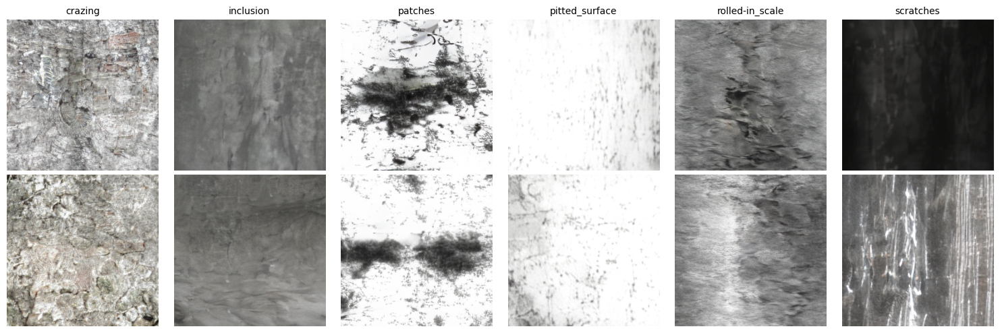

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch010.pt


Epoch 11/100: 100%|██████████| 664/664 [01:01<00:00, 10.84it/s, loss=8.1393, acc=0.7%]


Epoch 11/100 | Loss: 8.0106 | Acc: 0.9% | LR: 0.000088


Epoch 12/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=8.2593, acc=0.7%]


Epoch 12/100 | Loss: 7.9788 | Acc: 1.0% | LR: 0.000087


Epoch 13/100: 100%|██████████| 664/664 [01:01<00:00, 10.89it/s, loss=8.1157, acc=0.8%]


Epoch 13/100 | Loss: 7.9419 | Acc: 1.0% | LR: 0.000086


Epoch 14/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=8.0640, acc=0.6%]


Epoch 14/100 | Loss: 7.9123 | Acc: 1.1% | LR: 0.000085


Epoch 15/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.8860, acc=1.2%]


Epoch 15/100 | Loss: 7.8760 | Acc: 1.2% | LR: 0.000084


Epoch 16/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.7406, acc=1.2%]


Epoch 16/100 | Loss: 7.8399 | Acc: 1.3% | LR: 0.000083


Epoch 17/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.7923, acc=1.2%]


Epoch 17/100 | Loss: 7.8041 | Acc: 1.4% | LR: 0.000081


Epoch 18/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.7173, acc=1.6%]


Epoch 18/100 | Loss: 7.7742 | Acc: 1.4% | LR: 0.000080


Epoch 19/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.9045, acc=1.3%]


Epoch 19/100 | Loss: 7.7446 | Acc: 1.5% | LR: 0.000079


Epoch 20/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=7.6804, acc=1.5%]


Epoch 20/100 | Loss: 7.7151 | Acc: 1.6% | LR: 0.000077

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch020.png


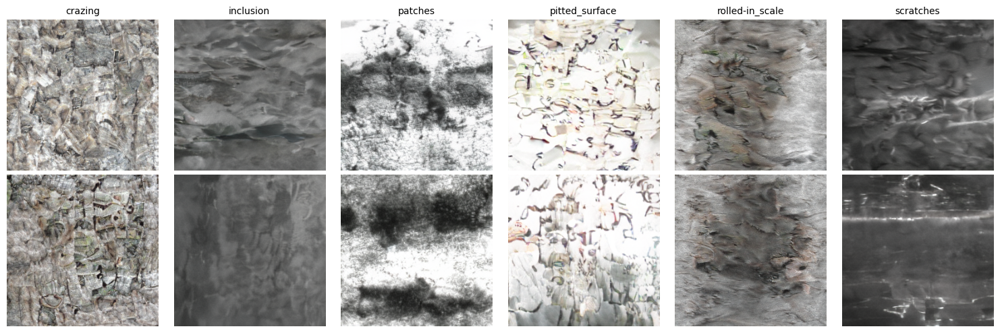

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch020.pt


Epoch 21/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.7132, acc=2.5%]


Epoch 21/100 | Loss: 7.6728 | Acc: 1.8% | LR: 0.000076


Epoch 22/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=7.6913, acc=1.1%]


Epoch 22/100 | Loss: 7.6521 | Acc: 1.8% | LR: 0.000075


Epoch 23/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.4159, acc=2.1%]


Epoch 23/100 | Loss: 7.6311 | Acc: 1.9% | LR: 0.000073


Epoch 24/100: 100%|██████████| 664/664 [01:01<00:00, 10.87it/s, loss=7.8029, acc=1.6%]


Epoch 24/100 | Loss: 7.5963 | Acc: 2.0% | LR: 0.000072


Epoch 25/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.3770, acc=2.4%]


Epoch 25/100 | Loss: 7.5753 | Acc: 2.1% | LR: 0.000070


Epoch 26/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.4282, acc=3.9%]


Epoch 26/100 | Loss: 7.5430 | Acc: 2.2% | LR: 0.000069


Epoch 27/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=7.0873, acc=3.0%]


Epoch 27/100 | Loss: 7.5102 | Acc: 2.3% | LR: 0.000067


Epoch 28/100: 100%|██████████| 664/664 [01:01<00:00, 10.84it/s, loss=7.4461, acc=1.9%]


Epoch 28/100 | Loss: 7.4876 | Acc: 2.5% | LR: 0.000065


Epoch 29/100: 100%|██████████| 664/664 [01:01<00:00, 10.84it/s, loss=7.7516, acc=1.8%]


Epoch 29/100 | Loss: 7.4581 | Acc: 2.6% | LR: 0.000064


Epoch 30/100: 100%|██████████| 664/664 [01:01<00:00, 10.83it/s, loss=7.4340, acc=2.1%]


Epoch 30/100 | Loss: 7.4318 | Acc: 2.7% | LR: 0.000062

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch030.png


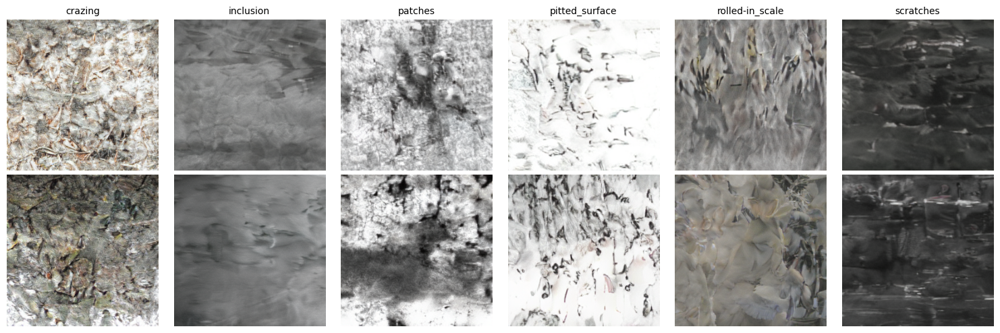

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch030.pt


Epoch 31/100: 100%|██████████| 664/664 [01:01<00:00, 10.83it/s, loss=7.4911, acc=2.1%]


Epoch 31/100 | Loss: 7.4257 | Acc: 2.7% | LR: 0.000061


Epoch 32/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.4628, acc=2.2%]


Epoch 32/100 | Loss: 7.3998 | Acc: 2.8% | LR: 0.000059


Epoch 33/100: 100%|██████████| 664/664 [01:01<00:00, 10.80it/s, loss=7.1496, acc=5.7%]


Epoch 33/100 | Loss: 7.3730 | Acc: 2.9% | LR: 0.000057


Epoch 34/100: 100%|██████████| 664/664 [01:01<00:00, 10.77it/s, loss=7.3342, acc=2.9%]


Epoch 34/100 | Loss: 7.3534 | Acc: 3.1% | LR: 0.000056


Epoch 35/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.4317, acc=2.9%]


Epoch 35/100 | Loss: 7.3326 | Acc: 3.1% | LR: 0.000054


Epoch 36/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.1764, acc=4.1%]


Epoch 36/100 | Loss: 7.2904 | Acc: 3.4% | LR: 0.000052


Epoch 37/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.4026, acc=2.2%]


Epoch 37/100 | Loss: 7.2794 | Acc: 3.4% | LR: 0.000051


Epoch 38/100: 100%|██████████| 664/664 [01:01<00:00, 10.83it/s, loss=7.0379, acc=4.0%]


Epoch 38/100 | Loss: 7.2595 | Acc: 3.5% | LR: 0.000049


Epoch 39/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=7.1385, acc=3.4%]


Epoch 39/100 | Loss: 7.2391 | Acc: 3.6% | LR: 0.000048


Epoch 40/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.4050, acc=3.1%]


Epoch 40/100 | Loss: 7.2232 | Acc: 3.7% | LR: 0.000046

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch040.png


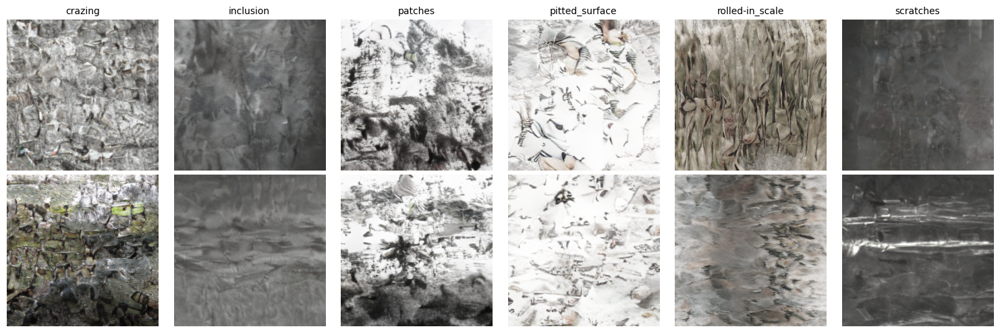

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch040.pt


Epoch 41/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=7.2203, acc=3.8%]


Epoch 41/100 | Loss: 7.1920 | Acc: 3.9% | LR: 0.000044


Epoch 42/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=6.8855, acc=4.0%]


Epoch 42/100 | Loss: 7.1684 | Acc: 4.0% | LR: 0.000043


Epoch 43/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.1429, acc=3.4%]


Epoch 43/100 | Loss: 7.1560 | Acc: 4.1% | LR: 0.000041


Epoch 44/100: 100%|██████████| 664/664 [01:01<00:00, 10.85it/s, loss=6.9510, acc=5.9%]


Epoch 44/100 | Loss: 7.1439 | Acc: 4.2% | LR: 0.000039


Epoch 45/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=7.4114, acc=3.5%]


Epoch 45/100 | Loss: 7.1198 | Acc: 4.3% | LR: 0.000038


Epoch 46/100: 100%|██████████| 664/664 [01:01<00:00, 10.85it/s, loss=6.7675, acc=5.6%]


Epoch 46/100 | Loss: 7.1097 | Acc: 4.4% | LR: 0.000036


Epoch 47/100: 100%|██████████| 664/664 [01:01<00:00, 10.85it/s, loss=7.1600, acc=4.1%]


Epoch 47/100 | Loss: 7.0825 | Acc: 4.5% | LR: 0.000035


Epoch 48/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=6.7003, acc=6.5%]


Epoch 48/100 | Loss: 7.0638 | Acc: 4.6% | LR: 0.000033


Epoch 49/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=7.4420, acc=3.5%]


Epoch 49/100 | Loss: 7.0472 | Acc: 4.7% | LR: 0.000031


Epoch 50/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.5846, acc=3.4%]


Epoch 50/100 | Loss: 7.0368 | Acc: 4.8% | LR: 0.000030

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch050.png


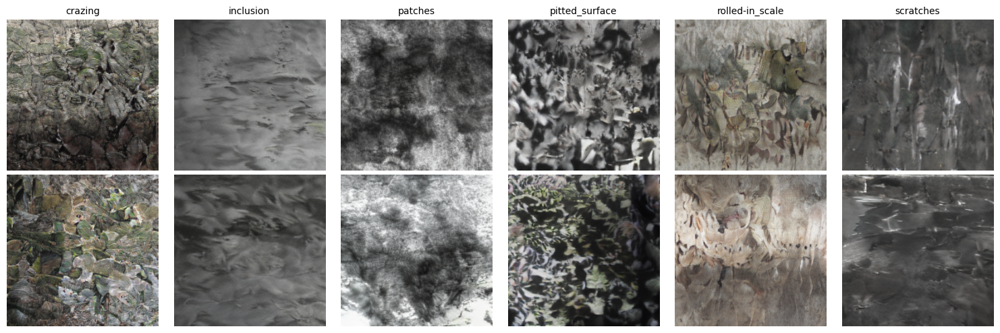

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch050.pt


Epoch 51/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.9641, acc=4.2%]


Epoch 51/100 | Loss: 7.0161 | Acc: 4.9% | LR: 0.000028


Epoch 52/100: 100%|██████████| 664/664 [01:00<00:00, 10.93it/s, loss=7.2693, acc=3.1%]


Epoch 52/100 | Loss: 6.9966 | Acc: 5.0% | LR: 0.000027


Epoch 53/100: 100%|██████████| 664/664 [01:00<00:00, 10.93it/s, loss=7.2032, acc=4.1%]


Epoch 53/100 | Loss: 6.9937 | Acc: 5.1% | LR: 0.000025


Epoch 54/100: 100%|██████████| 664/664 [01:00<00:00, 10.93it/s, loss=6.5367, acc=7.9%]


Epoch 54/100 | Loss: 6.9722 | Acc: 5.2% | LR: 0.000024


Epoch 55/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=7.0053, acc=4.5%]


Epoch 55/100 | Loss: 6.9540 | Acc: 5.3% | LR: 0.000023


Epoch 56/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=6.7908, acc=5.0%]


Epoch 56/100 | Loss: 6.9558 | Acc: 5.3% | LR: 0.000021


Epoch 57/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.3496, acc=3.4%]


Epoch 57/100 | Loss: 6.9410 | Acc: 5.4% | LR: 0.000020


Epoch 58/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=6.4466, acc=8.5%]


Epoch 58/100 | Loss: 6.9294 | Acc: 5.5% | LR: 0.000019


Epoch 59/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=6.7013, acc=5.9%]


Epoch 59/100 | Loss: 6.9031 | Acc: 5.6% | LR: 0.000017


Epoch 60/100: 100%|██████████| 664/664 [01:00<00:00, 10.94it/s, loss=6.6728, acc=5.9%]


Epoch 60/100 | Loss: 6.8967 | Acc: 5.7% | LR: 0.000016

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch060.png


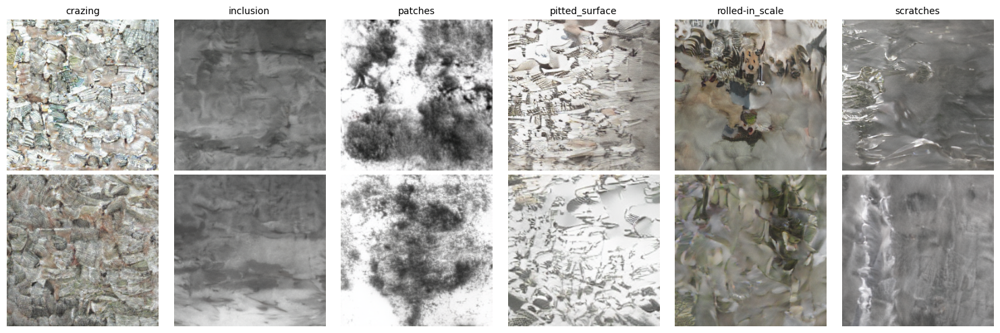

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch060.pt


Epoch 61/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.7100, acc=7.9%]


Epoch 61/100 | Loss: 6.8928 | Acc: 5.8% | LR: 0.000015


Epoch 62/100: 100%|██████████| 664/664 [01:00<00:00, 10.92it/s, loss=6.9821, acc=5.1%]


Epoch 62/100 | Loss: 6.8768 | Acc: 5.8% | LR: 0.000014


Epoch 63/100: 100%|██████████| 664/664 [01:01<00:00, 10.87it/s, loss=7.0022, acc=5.3%]


Epoch 63/100 | Loss: 6.8849 | Acc: 5.8% | LR: 0.000013


Epoch 64/100: 100%|██████████| 664/664 [01:01<00:00, 10.85it/s, loss=7.0238, acc=5.1%]


Epoch 64/100 | Loss: 6.8539 | Acc: 6.0% | LR: 0.000012


Epoch 65/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=6.9769, acc=5.5%]


Epoch 65/100 | Loss: 6.8445 | Acc: 6.0% | LR: 0.000011


Epoch 66/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=6.5859, acc=7.4%]


Epoch 66/100 | Loss: 6.8490 | Acc: 6.1% | LR: 0.000010


Epoch 67/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.7424, acc=5.5%]


Epoch 67/100 | Loss: 6.8440 | Acc: 6.1% | LR: 0.000009


Epoch 68/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.3558, acc=3.4%]


Epoch 68/100 | Loss: 6.8234 | Acc: 6.2% | LR: 0.000008


Epoch 69/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=6.9873, acc=4.2%]


Epoch 69/100 | Loss: 6.8011 | Acc: 6.3% | LR: 0.000007


Epoch 70/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=7.0236, acc=4.8%]


Epoch 70/100 | Loss: 6.8004 | Acc: 6.4% | LR: 0.000006

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch070.png


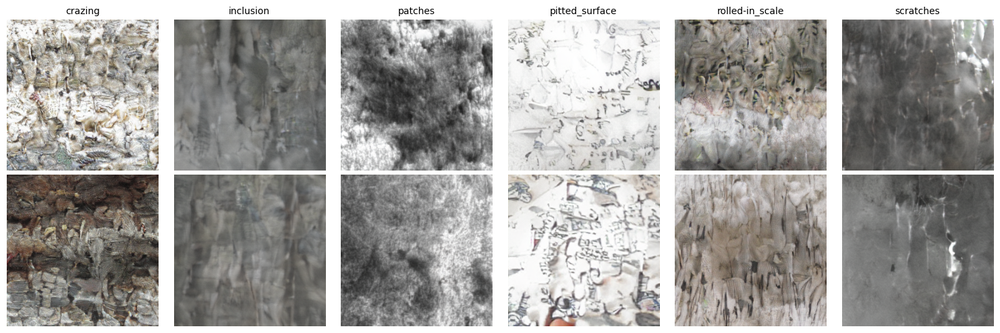

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch070.pt


Epoch 71/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.7638, acc=6.7%]


Epoch 71/100 | Loss: 6.8118 | Acc: 6.3% | LR: 0.000005


Epoch 72/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.5767, acc=9.0%]


Epoch 72/100 | Loss: 6.7885 | Acc: 6.4% | LR: 0.000005


Epoch 73/100: 100%|██████████| 664/664 [01:01<00:00, 10.83it/s, loss=6.7417, acc=7.0%]


Epoch 73/100 | Loss: 6.7949 | Acc: 6.4% | LR: 0.000004


Epoch 74/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.0631, acc=5.6%]


Epoch 74/100 | Loss: 6.7912 | Acc: 6.4% | LR: 0.000003


Epoch 75/100: 100%|██████████| 664/664 [01:01<00:00, 10.79it/s, loss=6.6370, acc=7.8%]


Epoch 75/100 | Loss: 6.7767 | Acc: 6.5% | LR: 0.000003


Epoch 76/100: 100%|██████████| 664/664 [01:01<00:00, 10.81it/s, loss=6.9049, acc=5.6%]


Epoch 76/100 | Loss: 6.7780 | Acc: 6.6% | LR: 0.000002


Epoch 77/100: 100%|██████████| 664/664 [01:01<00:00, 10.87it/s, loss=6.5871, acc=8.8%]


Epoch 77/100 | Loss: 6.7768 | Acc: 6.5% | LR: 0.000002


Epoch 78/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.2364, acc=4.6%]


Epoch 78/100 | Loss: 6.7729 | Acc: 6.6% | LR: 0.000001


Epoch 79/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.5475, acc=9.1%]


Epoch 79/100 | Loss: 6.7671 | Acc: 6.6% | LR: 0.000001


Epoch 80/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=7.0126, acc=4.9%]


Epoch 80/100 | Loss: 6.7597 | Acc: 6.7% | LR: 0.000001

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch080.png


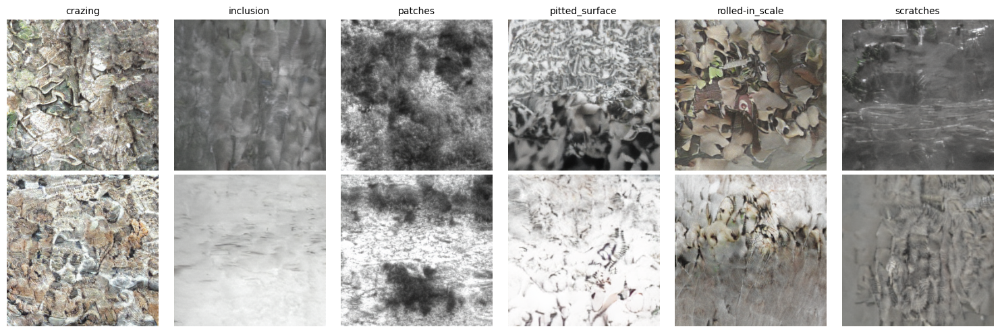

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch080.pt


Epoch 81/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.9422, acc=6.8%]


Epoch 81/100 | Loss: 6.7658 | Acc: 6.6% | LR: 0.000000


Epoch 82/100: 100%|██████████| 664/664 [01:01<00:00, 10.87it/s, loss=7.0718, acc=5.4%]


Epoch 82/100 | Loss: 6.7726 | Acc: 6.6% | LR: 0.000000


Epoch 83/100: 100%|██████████| 664/664 [01:00<00:00, 10.91it/s, loss=6.7566, acc=7.0%]


Epoch 83/100 | Loss: 6.7625 | Acc: 6.7% | LR: 0.000000


Epoch 84/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.7236, acc=5.1%]


Epoch 84/100 | Loss: 6.7608 | Acc: 6.7% | LR: 0.000000


Epoch 85/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.6778, acc=8.4%]


Epoch 85/100 | Loss: 6.7682 | Acc: 6.6% | LR: 0.000000


Epoch 86/100: 100%|██████████| 664/664 [01:00<00:00, 10.90it/s, loss=6.6806, acc=7.2%]


Epoch 86/100 | Loss: 6.7815 | Acc: 6.5% | LR: 0.000000


Epoch 87/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.0235, acc=5.8%]


Epoch 87/100 | Loss: 6.7610 | Acc: 6.7% | LR: 0.000000


Epoch 88/100: 100%|██████████| 664/664 [01:01<00:00, 10.84it/s, loss=6.6653, acc=6.3%]


Epoch 88/100 | Loss: 6.7703 | Acc: 6.6% | LR: 0.000000


Epoch 89/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.8708, acc=5.6%]


Epoch 89/100 | Loss: 6.7791 | Acc: 6.6% | LR: 0.000000


Epoch 90/100: 100%|██████████| 664/664 [01:01<00:00, 10.85it/s, loss=6.9662, acc=4.8%]


Epoch 90/100 | Loss: 6.7719 | Acc: 6.6% | LR: 0.000001

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch090.png


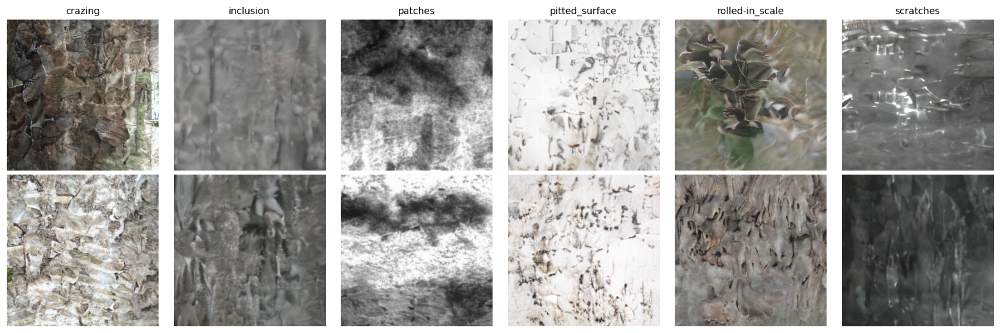

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch090.pt


Epoch 91/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=6.7162, acc=6.7%]


Epoch 91/100 | Loss: 6.7593 | Acc: 6.7% | LR: 0.000001


Epoch 92/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=6.9052, acc=6.8%]


Epoch 92/100 | Loss: 6.7582 | Acc: 6.7% | LR: 0.000001


Epoch 93/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.7107, acc=6.8%]


Epoch 93/100 | Loss: 6.7719 | Acc: 6.6% | LR: 0.000002


Epoch 94/100: 100%|██████████| 664/664 [01:00<00:00, 10.89it/s, loss=7.0176, acc=5.9%]


Epoch 94/100 | Loss: 6.7585 | Acc: 6.7% | LR: 0.000002


Epoch 95/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.6924, acc=9.2%]


Epoch 95/100 | Loss: 6.7721 | Acc: 6.6% | LR: 0.000003


Epoch 96/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=7.1342, acc=4.0%]


Epoch 96/100 | Loss: 6.7779 | Acc: 6.6% | LR: 0.000003


Epoch 97/100: 100%|██████████| 664/664 [01:01<00:00, 10.88it/s, loss=6.4700, acc=8.4%]


Epoch 97/100 | Loss: 6.7790 | Acc: 6.6% | LR: 0.000004


Epoch 98/100: 100%|██████████| 664/664 [01:01<00:00, 10.87it/s, loss=7.1617, acc=6.1%]


Epoch 98/100 | Loss: 6.7641 | Acc: 6.6% | LR: 0.000005


Epoch 99/100: 100%|██████████| 664/664 [01:01<00:00, 10.86it/s, loss=6.7295, acc=7.0%]


Epoch 99/100 | Loss: 6.7832 | Acc: 6.5% | LR: 0.000005


Epoch 100/100: 100%|██████████| 664/664 [01:01<00:00, 10.82it/s, loss=7.0039, acc=4.6%]


Epoch 100/100 | Loss: 6.7794 | Acc: 6.5% | LR: 0.000006

🎨 샘플 이미지 생성 중...


💾 샘플 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/samples/epoch100.png


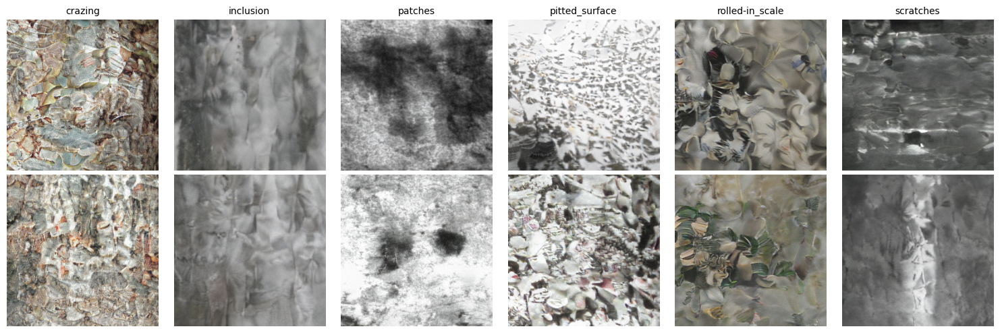

💾 체크포인트 저장: /content/drive/MyDrive/metal-defect/halton-maskgit/checkpoints/maskgit_epoch100.pt

✅ 학습 완료!


In [ ]:
# ============================================
# 학습 루프
# ============================================

# 학습 기록
train_losses = []
train_accs = []

print("=" * 50)
print("🚀 학습 시작")
print("=" * 50)

for epoch in range(NUM_EPOCHS):
    # 학습
    avg_loss, avg_acc = train_one_epoch(
        maskgit, token_dataloader, optimizer, criterion, epoch
    )

    # 스케줄러 업데이트
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]

    # 기록
    train_losses.append(avg_loss)
    train_accs.append(avg_acc)

    print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Loss: {avg_loss:.4f} | Acc: {avg_acc*100:.1f}% | LR: {current_lr:.6f}")

    # 주기적 샘플 생성
    if (epoch + 1) % SAMPLE_EVERY == 0:
        print(f"\n🎨 샘플 이미지 생성 중...")
        save_path = f"{SAMPLE_DIR}/epoch{epoch+1:03d}.png"
        generate_and_visualize(maskgit, vqgan, sampler, num_per_class=2, save_path=save_path)

    # 주기적 체크포인트 저장
    if (epoch + 1) % SAVE_EVERY == 0:
        ckpt_path = f"{CKPT_DIR}/maskgit_epoch{epoch+1:03d}.pt"
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': maskgit.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_losses': train_losses,
            'train_accs': train_accs,
            'config': {
                'model_size': MODEL_SIZE,
                'vocab_size': CODEBOOK_SIZE,
                'seq_len': SEQ_LEN,
                'num_classes': NUM_CLASSES,
                **model_config
            }
        }, ckpt_path)
        print(f"💾 체크포인트 저장: {ckpt_path}")

print("\n" + "=" * 50)
print("✅ 학습 완료!")
print("=" * 50)